## Import necessary packages

In [1]:
%matplotlib inline

# DataFrame
import pandas as pd

# Elasticsearch
from elasticsearch import Elasticsearch, helpers

# datetime
from datetime import datetime

# isnan()
import math

# plot
import numpy as np
import matplotlib.pyplot as plt

# Change plot style to ggplot
plt.style.use('ggplot')

## Collect all traceroute records (src == MWT2) from the earliest date (must be someday in July) to less than 2016/08/24

In [2]:
es = Elasticsearch(['atlas-kibana.mwt2.org:9200'], timeout=600)

In [3]:
my_query = {
    "query": {
        "bool": {
            "must": [
                {"term": { "_type": "traceroute" }},
                {"term": { "srcSite": "MWT2" }}
            ],
            "filter": {
                "range": {
                    "timestamp": {
                        "lt": "2016-08-24"
                    }
                }
            }
        }
    },
    "fielddata_fields": "timestamp"
}

print(my_query)

my_index = ['network_weather_2-2016.7.*', 'network_weather_2-2016.8.*']

print(my_index)

{'query': {'bool': {'must': [{'term': {'_type': 'traceroute'}}, {'term': {'srcSite': 'MWT2'}}], 'filter': {'range': {'timestamp': {'lt': '2016-08-24'}}}}}, 'fielddata_fields': 'timestamp'}
['network_weather_2-2016.7.*', 'network_weather_2-2016.8.*']


In [4]:
site_ip_name = {}    # Key is site ip, value is site name

path_hash_hops = {}    # Key is path hash, value is path hops

In [5]:
# The data of each src / dest pair is stored in its individual DataFrame
# And all the DataFrames are collected in a nested dictionary

raw_data_pool = {}

def make_sure(src_site_name, src_site_ip, dest_site_name, dest_site_ip):
    if src_site_ip not in raw_data_pool:
        raw_data_pool[src_site_ip] = {}
        site_ip_name[src_site_ip] = src_site_name
    if dest_site_ip not in raw_data_pool[src_site_ip]:
        raw_data_pool[src_site_ip][dest_site_ip] = pd.DataFrame()
        site_ip_name[dest_site_ip] = dest_site_name

def put_data(src_site_name, src_site_ip, dest_site_name, dest_site_ip, timestamp_epoch, column_type, value):
    make_sure(src_site_name, src_site_ip, dest_site_name, dest_site_ip)
    raw_data_pool[src_site_ip][dest_site_ip].set_value(timestamp_epoch, column_type, value)

def put_data_2(src_site_name, src_site_ip, dest_site_name, dest_site_ip, timestamp_epoch, column_type, value):
    raw_data_pool[src_site_ip][dest_site_ip].set_value(timestamp_epoch, column_type, value)

In [ ]:
set_timestamp = set()   # To check the earliest and latest time
list_path_hash = []     # Store all the path hash values

# Note that the usage of scroll should be discouraged
scroll = list(helpers.scan(client=es, query=my_query, index=my_index, request_timeout=600))
count = 0
for result in scroll:
    count += 1
    
    timestamp_epoch = result['fields']['timestamp'][0]
    info = result['_source']
    iso_8601 = info.get('timestamp', 'NoReadableTimestamp')
    src_ip = info.get('src', 'NoSrcIP')
    src_name = info.get('srcSite', 'NoSrcName')
    src_prod = info.get('srcProduction', 'NoSrcProd')
    dest_ip = info.get('dest', 'NoDestIP')
    dest_name = info.get('destSite', 'NoDestName')
    dest_prod = info.get('destProduction', 'NoDestProd')
    path_hash = info.get('hash', 'NoPathHash')
    path_hops = info.get('hops', 'NoPathHops')
    
    set_timestamp.add(timestamp_epoch)
    
    # Note that when the hash value is stored in DataFrame
    # it is kind of converted from int to floating point number (because the value is too large or too small)
    # And in order to use it as the key in the dictionary path_hash_hops
    # the floating point number needs to be converted back to int
    # and we can not get the original hash value precisely
    # That is why I wrote the helper function adjust_path_hash to find out the original hash value
    put_data(src_name, src_ip, dest_name, dest_ip, timestamp_epoch, 'iso_8601', iso_8601)
    put_data_2(src_name, src_ip, dest_name, dest_ip, timestamp_epoch, 'src_prod', src_prod)
    put_data_2(src_name, src_ip, dest_name, dest_ip, timestamp_epoch, 'dest_prod', dest_prod)
    put_data_2(src_name, src_ip, dest_name, dest_ip, timestamp_epoch, 'path_hash', path_hash)
    
    path_hash_hops[path_hash] = path_hops
    list_path_hash.append(path_hash)
    
    if count % 1000 == 0:
        print('Collecting raw data, count == {}'.format(count))

print(count)

In [7]:
site_ip_name

{'109.105.124.88': 'NDGF-T1',
 '128.142.223.246': 'CERN-PROD',
 '129.107.255.27': 'NoDestName',
 '129.107.255.30': 'UTA_SWT2',
 '129.15.40.232': 'OU_OCHEP_SWT2',
 '129.215.213.69': 'UKI-SCOTGRID-ECDF',
 '129.93.5.165': 'Nebraska',
 '130.209.239.123': 'UKI-SCOTGRID-GLASGOW',
 '130.246.176.110': 'RAL-LCG2',
 '130.246.47.130': 'UKI-SOUTHGRID-RALPP',
 '131.154.254.11': 'INFN-T1',
 '131.169.98.29': 'DESY-HH',
 '132.206.245.253': 'CA-MCGILL-CLUMEQ-T2',
 '134.158.103.9': 'IN2P3-LAPP',
 '134.158.123.184': 'IN2P3-LPC',
 '134.158.132.201': 'GRIF',
 '134.158.159.86': 'GRIF',
 '134.158.20.191': 'IN2P3-CPPM',
 '134.158.73.244': 'GRIF',
 '134.219.225.13': 'UKI-LT2-RHUL',
 '134.79.118.8': 'WT2',
 '138.253.60.81': 'UKI-NORTHGRID-LIV-HEP',
 '141.108.35.17': 'INFN-ROMA1',
 '141.142.141.2': 'NoDestName',
 '141.34.200.29': 'DESY-ZN',
 '142.150.19.60': 'CA-SCINET-T2',
 '144.16.111.26': 'INDIACMS-TIFR',
 '144.206.236.188': 'RRC-KI-T1',
 '144.206.237.141': 'RRC-KI',
 '145.100.17.9': 'SARA-MATRIX',
 '146.83.9

In [8]:
path_hash_hops

{0: [],
 3994000044404154367: ['72.36.96.1',
  '130.126.1.109',
  '72.36.127.185',
  '72.36.126.70',
  '72.36.126.66',
  '72.36.126.74',
  '72.36.126.93',
  '72.36.126.89',
  '72.36.126.77',
  '72.36.126.81',
  '72.36.126.97',
  '72.36.127.154',
  '149.165.254.146',
  '149.165.254.250',
  '149.165.225.224'],
 3621011356066947075: ['149.165.225.254',
  '149.165.254.249',
  '149.165.254.186',
  '198.71.45.57',
  '62.40.98.77',
  '62.40.98.153',
  '62.40.124.193',
  '130.206.245.89',
  '147.156.200.30',
  '147.156.116.41'],
 -4484930002641215482: ['149.165.225.254',
  '149.165.254.249',
  '149.165.254.186',
  '198.71.45.57',
  '146.97.143.212'],
 -7394478567314657276: ['72.36.96.1',
  '130.126.1.109',
  '72.36.127.185',
  '72.36.126.70',
  '72.36.126.66',
  '72.36.126.86',
  '72.36.126.74',
  '72.36.126.77',
  '72.36.126.93',
  '72.36.126.81',
  '72.36.126.97',
  '198.71.45.15',
  '74.200.187.37',
  '208.76.227.177',
  '129.107.255.30'],
 -8987835961265523366: ['149.165.225.254',
  '149.1

In [13]:
for path_hash in list_path_hash:
    if path_hash not in path_hash_hops:
        print(path_hash)

767088258274177952
8510477699910703797
-6346262052127937561
3540934200615826253
7651063394452986090
7696207268375192715
9106291004777683192
3370605549878119409
3410516483702637568
-6346262052127937561
7654479033363430336
-2401587307687634508
-7763927483598848046
4380052513041291323
2997574624752966903
-4246300934644062575
6358436535834888157
-9139901594102353239
2052682350582147476
2443917159091209078
-2081270190466763137
-4076529032068802770
-7266034744106442194
-2888651551678557275
-6768564840564066379
-7763927483598848046
6761207925750194111
-4141749053562003048
4380052513041291323
-764472462468467288
-3631658392960654982
5782454486314037803
-4499483302631435034
1616569625591061100
8517518833314085043
-393160093812874664
8101195175854315559
1767930609705631495
1767930609705631495
-5311565326531739327
7696207268374192883
-6441777884802317519
200984357152520065
3368705086014155271
-2479314487775284172
-6346262052127937561
-2888651551678557275
-8865797141642104054
4241895723745294886
1

In [15]:
set_path_hash = set(list_path_hash)

In [20]:
# Get the max and min path hash values from all the records
hash_min = 0
hash_max = 0
for path_hash in set_path_hash:
    if path_hash > hash_max:
        hash_max = path_hash
    elif path_hash < hash_min:
        hash_min = path_hash
print(hash_min)
print(hash_max)

-9222325946201148805
9223321828740319353


In [31]:
# To demonstrate this implementation introduced problem, have a look at the codes below
# The hash value -5113145718247506944 is originally actually -5113145718247506684
# The hash value -217126552733518368 is originally actually -217126552733518376
path_hash_1 = int(raw_data_pool['192.170.227.162']['134.158.123.184'].path_hash.iloc[0])
path_hash_2 = int(raw_data_pool['192.170.227.162']['134.158.123.184'].path_hash.iloc[2])
print(path_hash_1)
print(path_hash_2)
print()
print()

for i in range(path_hash_1 - 1000, path_hash_1 + 1000):
    if i in set_path_hash:
        print(i)
print()
print()

for i in range(path_hash_2 - 1000, path_hash_2 + 1000):
    if i in set_path_hash:
        print(i)

-5113145718247506944
-217126552733518368


-5113145718247506684


-217126552733518376


In [32]:
# Now that we get back the original hash value, we can use it to retrieve the path hops from
# the dictionary path_hash_hops just as expected

path_hash_1 = -5113145718247506684
path_hash_2 = -217126552733518376

hops_1 = path_hash_hops[path_hash_1]
hops_2 = path_hash_hops[path_hash_2]

In [33]:
hops_1

['192.170.226.1',
 '192.170.224.77',
 '198.124.80.77',
 '62.40.126.153',
 '62.40.126.152',
 '62.40.126.222',
 '193.51.191.77',
 '134.158.123.184']

In [34]:
hops_2

['192.170.224.77',
 '198.124.80.77',
 '62.40.126.153',
 '62.40.126.152',
 '62.40.126.222',
 '193.51.191.77',
 '134.158.123.184']

In [19]:
# There are four source IP addresses: UC, IU, and UIUC_1 and UIUC_2
for src_ip in raw_data_pool:
    print(src_ip)

192.170.227.162
72.36.96.16
72.36.96.9
149.165.225.224


In [ ]:
# Check the earliest and latest timestamp
a = pd.DataFrame(list(set_timestamp))
a.min()
a.max()

In [84]:
# Count the number of unique records for each src site
for src_ip in raw_data_pool:
    print(src_ip)
    count_unique_records = 0
    for dest_ip in raw_data_pool[src_ip]:
        count_unique_records += raw_data_pool[src_ip][dest_ip].count()['iso_8601']
    print(count_unique_records)

72.36.96.16
9647
72.36.96.9
68129
149.165.225.224
83560
192.170.227.162
84160


In [36]:
# Count how many records mark the srcProduct True (or False)
for src_ip in raw_data_pool:
    count_src_prod_true = 0
    count_src_prod_false = 0
    for dest_ip in raw_data_pool[src_ip]:
        df = raw_data_pool[src_ip][dest_ip]
        column = df['src_prod']
        count_src_prod_true += len(column[column == True])
        count_src_prod_false += len(column[column == False])
    print(src_ip)
    print("True")
    print(count_src_prod_true)
    print("False")
    print(count_src_prod_false)

192.170.227.162
True
0
False
84160
72.36.96.16
True
0
False
9647
72.36.96.9
True
0
False
68129
149.165.225.224
True
0
False
83560


In [37]:
# Count how many records mark the destProduct True (or False)
for src_ip in raw_data_pool:
    count_src_prod_true = 0
    count_src_prod_false = 0
    for dest_ip in raw_data_pool[src_ip]:
        df = raw_data_pool[src_ip][dest_ip]
        column = df['dest_prod']
        count_src_prod_true += len(column[column == True])
        count_src_prod_false += len(column[column == False])
    print(src_ip)
    print("True")
    print(count_src_prod_true)
    print("False")
    print(count_src_prod_false)
    print("=========================")

192.170.227.162
True
4698
False
79462
72.36.96.16
True
59
False
9588
72.36.96.9
True
3383
False
64746
149.165.225.224
True
4673
False
78887


In [85]:
# Count the number of unique dest sites for each src site
for src_ip in raw_data_pool:
    print(src_ip)
    print(len(raw_data_pool[src_ip]))
    print()

72.36.96.16
7

72.36.96.9
79

149.165.225.224
81

192.170.227.162
81



In [39]:
# Count the total number of dest sites combining UIUC_1 and UIUC_2
list1 = raw_data_pool['72.36.96.9']
list2 = raw_data_pool['72.36.96.16']
list0 = set(list1)
for a in list2:
    list0.add(a)
len(list0)

80

In [53]:
# Examine the time coverage

large_min = 1000000000000000000000000
large_max = 1

for src_ip in raw_data_pool:
    print(src_ip)
    time_min = 1000000000000000000
    time_max = 1
    for dest_ip in raw_data_pool[src_ip]:
        df = raw_data_pool[src_ip][dest_ip]
        ind = df.index
        ind = ind[ind > 1000000000000]    # Because some records at the very beginning dates have wrong timestamp (correct ones)
        this_min = ind.min()
        this_max = ind.max()
        if this_min < time_min:
            time_min = this_min
        if this_max > time_max:
            time_max = this_max
    print("time_min")
    print(time_min)
    print("time_max")
    print(time_max)
    print()
    print()
    if time_min < large_min:
        large_min = time_min
    if time_max > large_max:
        large_max = time_max
print("large_min", large_min)
print("large_max", large_max)

192.170.227.162
time_min
1469730614000
time_max
1471954486000


72.36.96.16
time_min
1469731480000
time_max
1471954092000


72.36.96.9
time_min
1469731532000
time_max
1471954121000


149.165.225.224
time_min
1469725447000
time_max
1471954339000


large_min 1469725447000
large_max 1471954486000


In [52]:
# Examine the time coverage

small_min = 10000000000000000
small_max = 1

for src_ip in raw_data_pool:
    print(src_ip)
    time_min = 1000000000000000000
    time_max = 1
    for dest_ip in raw_data_pool[src_ip]:
        df = raw_data_pool[src_ip][dest_ip]
        ind = df.index
        ind = ind[ind < 1000000000000]    # Because some records at the very beginning dates have wrong timestamp (wrong ones)
        this_min = ind.min()
        this_max = ind.max()
        if this_min < time_min:
            time_min = this_min
        if this_max > time_max:
            time_max = this_max
    print("time_min")
    print(time_min)
    print("time_max")
    print(time_max)
    print()
    print()
    if time_min < small_min:
        small_min = time_min
    if time_max > small_max:
        small_max = time_max
print("small_min", small_min)
print("small_max", small_max)

192.170.227.162
time_min
1469726920
time_max
1469728259


72.36.96.16
time_min
1469727304
time_max
1469727983


72.36.96.9
time_min
1469723994
time_max
1469728082


149.165.225.224
time_min
1469727012
time_max
1469728221


small_min 1469723994
small_max 1469728259


In [48]:
# Sort a DataFrame based on its index, i.e. timestamp in this case
df.sort_index(inplace=True)

In [49]:
df   # As you can see, the first line has wrong timestamp (should in ms, but in s)

,iso_8601,src_prod,dest_prod,path_hash
1469727323,1469727323,False,False,3.370606e+18
1469733959000,2016-07-28T19:25:59,False,False,3.071858e+18
1469734555000,2016-07-28T19:35:55,False,False,3.370606e+18
1469737799000,2016-07-28T20:29:59,False,False,3.370606e+18
1469738278000,2016-07-28T20:37:58,False,False,3.370606e+18
1469741591000,2016-07-28T21:33:11,False,False,3.071858e+18
1469741851000,2016-07-28T21:37:31,False,False,3.071858e+18
1469745101000,2016-07-28T22:31:41,False,False,3.071858e+18
1469745313000,2016-07-28T22:35:13,False,False,3.370606e+18
1469747257000,2016-07-28T23:07:37,False,False,3.071858e+18


In [36]:
# All the links (i.e. dest sites) from UChicago as src site
uchicago_all_links = raw_data_pool['192.170.227.162']

In [ ]:
list_how_many_paths = []

list_two_paths_dest_ip = []

# Check how many paths are used for each src / dest pair

count = 0
for dest_ip in uchicago_all_links:
    count += 1
    print(count, dest_ip)
    df = uchicago_all_links[dest_ip]
    df.sort_index(inplace=True)
    dict_path_id = {}
    max_id = 0
    rows = df.count()['iso_8601']
    for r in range(rows):
        path_hash = df.iloc[r].path_hash
        if path_hash in dict_path_id:
            df.set_value(df.index[r], 'path_id', dict_path_id[path_hash])
        else:
            max_id += 1
            dict_path_id[path_hash] = max_id
            df.set_value(df.index[r], 'path_id', max_id)
    print("How many paths ==", max_id)
    print(dict_path_id)
    print()
    list_how_many_paths.append(max_id)
    print()
    if max_id == 2:
        print("===== Two paths ======")
        list_two_paths_dest_ip.append(dest_ip)
    print()

In [40]:
# These are the dest site IP addresses from UChicago as src site which used exactly two paths for each link (i.e. src/dest pair)
len(list_two_paths_dest_ip)  # answer is 19
list_two_paths_dest_ip

['159.93.225.210',
 '134.79.118.8',
 '192.41.236.36',
 '193.48.83.97',
 '128.142.223.246',
 '206.12.24.250',
 '144.16.111.26',
 '192.41.230.60',
 '142.150.19.60',
 '192.41.230.62',
 '132.206.245.253',
 '206.12.9.1',
 '193.48.99.77',
 '141.34.200.29',
 '192.41.236.32',
 '149.165.224.248',
 '194.190.165.191',
 '145.100.17.9',
 '134.158.123.184']

In [ ]:
def adjust_path_hash(path_hash):
    result = 999   # Default return value, indicating no original hash value found in the around +1000/-1000 range
    for i in range(path_hash - 1000, path_hash + 1000):
        if i in path_hash_hops:
            print(i)
            result = i
            return i
    return result

# For those links which exactly have two paths, print out these two paths and examine them by human eyes
# The finding is that: the only difference is the first hop 192.170.226.1 exists or not
for dest_ip in list_two_paths_dest_ip:
    print(dest_ip)
    df = uchicago_all_links[dest_ip]
    set_two_paths = set(df.path_hash)
    print(set_two_paths)
    print()
    print()
    for path_hash in set_two_paths:
        path_hash = adjust_path_hash(int(path_hash))
        print(path_hash_hops[path_hash])
        print('v.s.')
    print()
    print()
    print("==================================================================")

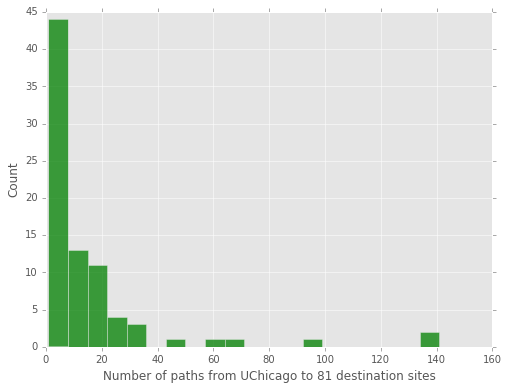

In [83]:
# The distribution about the number of paths from UChicago to the 81 destination sites
plt.figure(figsize=(8, 6))
plt.hist(list_how_many_paths, 20, facecolor='green', alpha=0.75)
plt.xlabel('Number of paths from UChicago to 81 destination sites')
plt.ylabel('Count')

In [108]:
# Print out the link ID for all the links which used two paths
count_temp = 0
for a in list_how_many_paths:
    count_temp += 1
    if a == 2:
        print(count_temp, a)

1 2
3 2
8 2
13 2
20 2
28 2
29 2
30 2
36 2
43 2
46 2
53 2
56 2
58 2
59 2
67 2
68 2
70 2
76 2


1 193.48.99.77


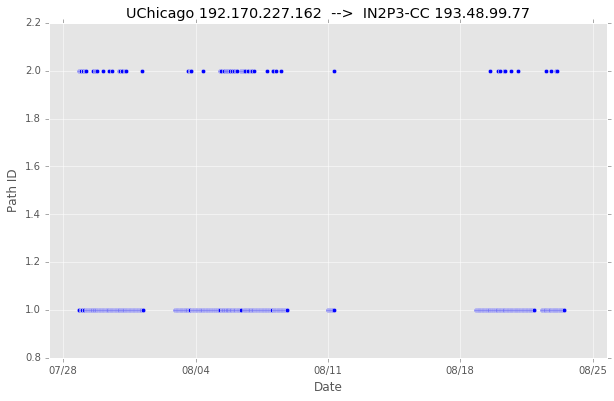



2 130.209.239.123


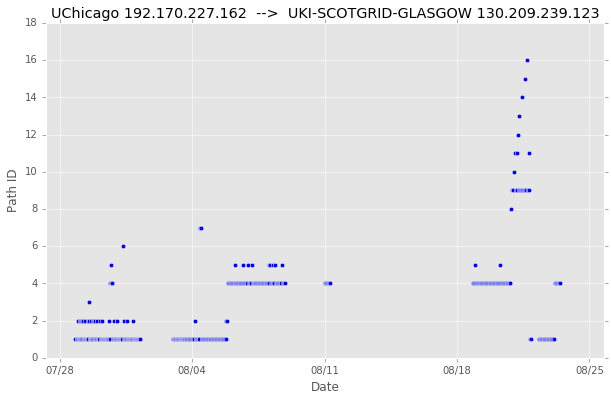



3 134.79.118.8


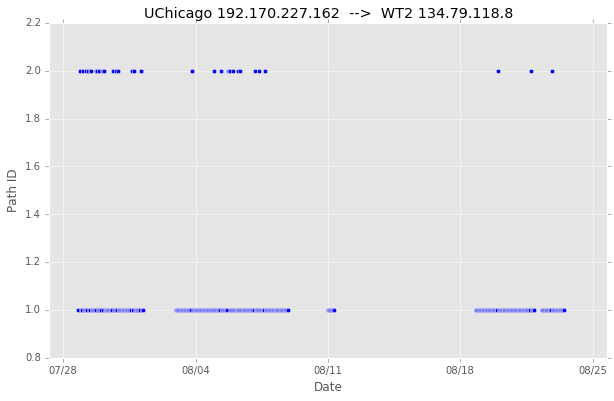



4 134.219.225.13


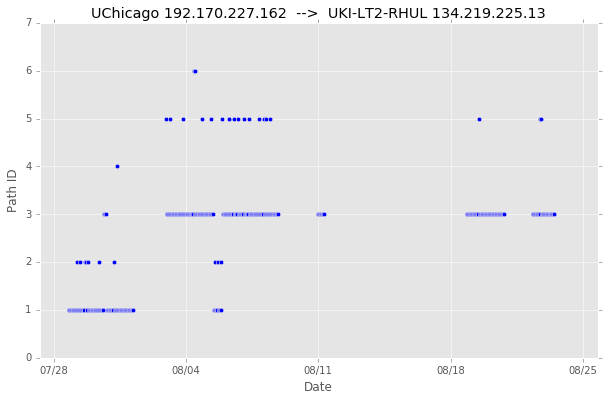



5 202.140.191.90


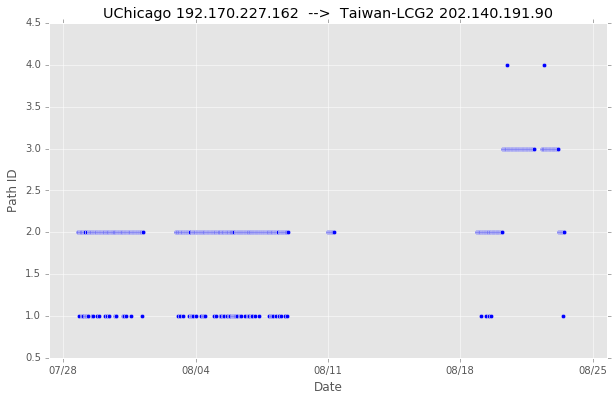



6 129.107.255.30


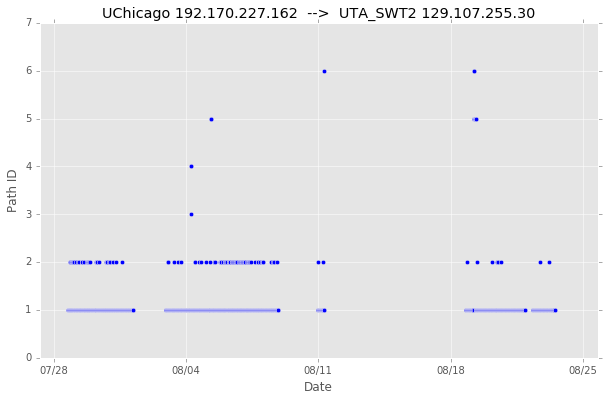



7 192.5.207.252


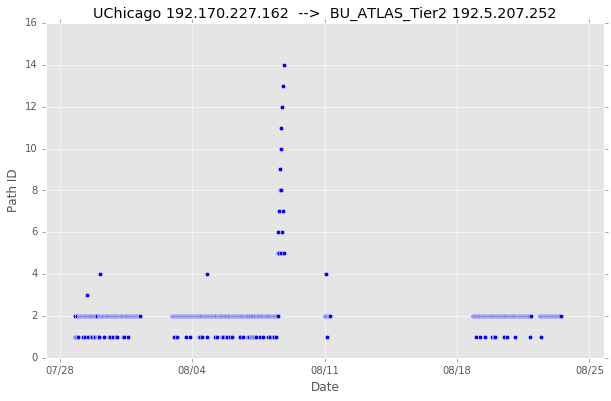



8 192.41.236.32


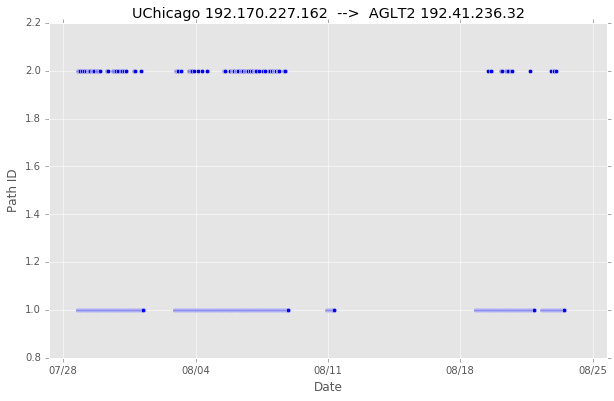



9 158.195.14.3


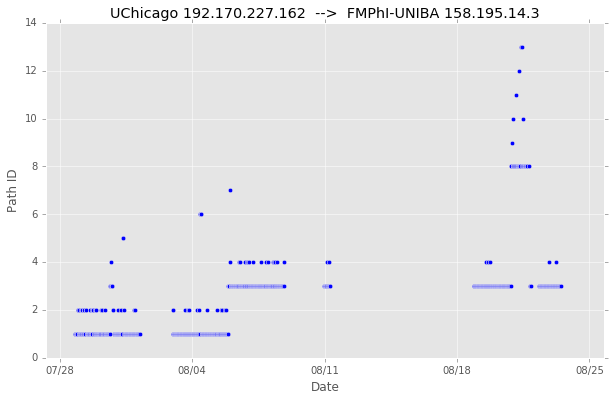



10 129.15.40.232


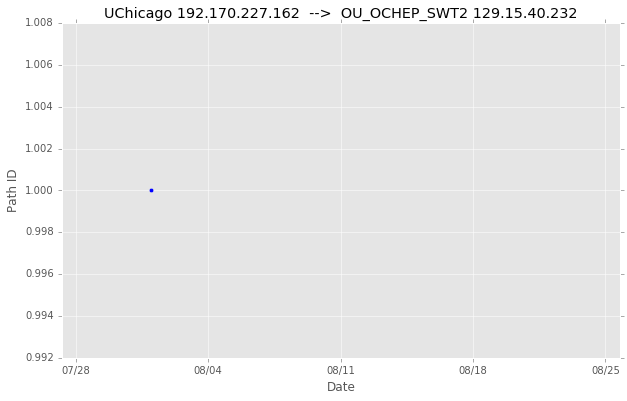



11 81.180.86.62


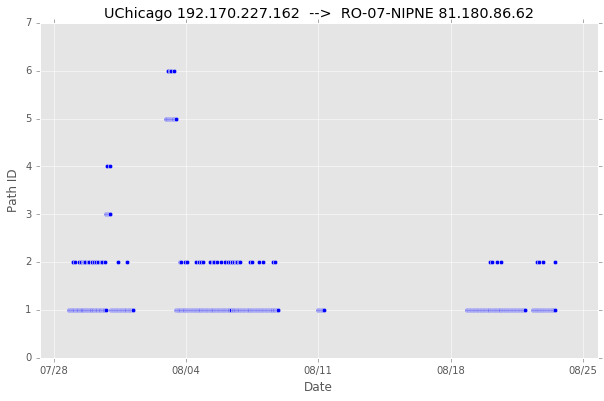



12 202.122.32.166


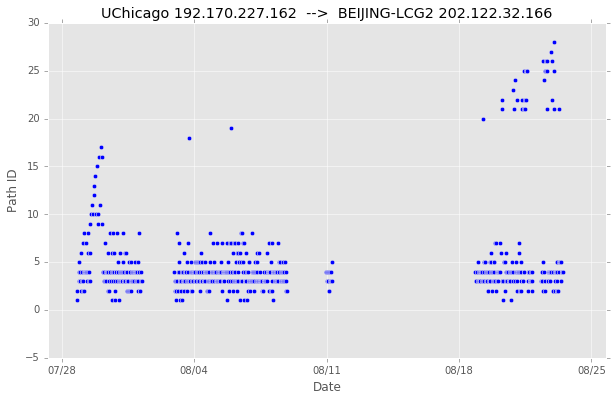



13 144.16.111.26


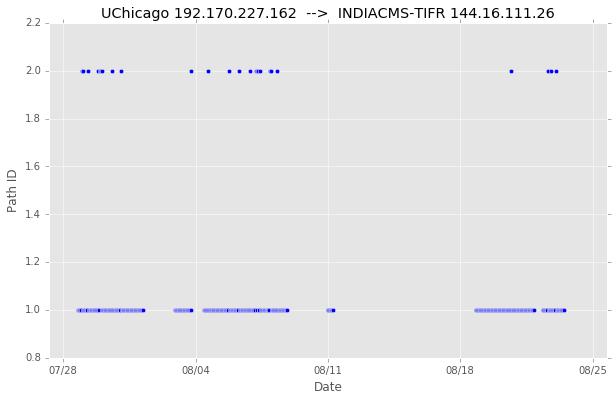



14 131.154.254.11


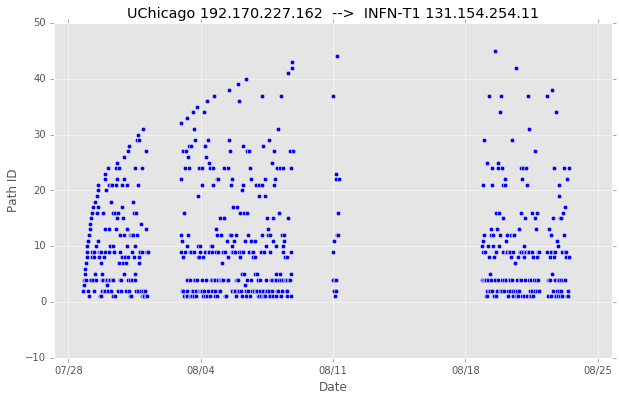



15 147.213.204.111


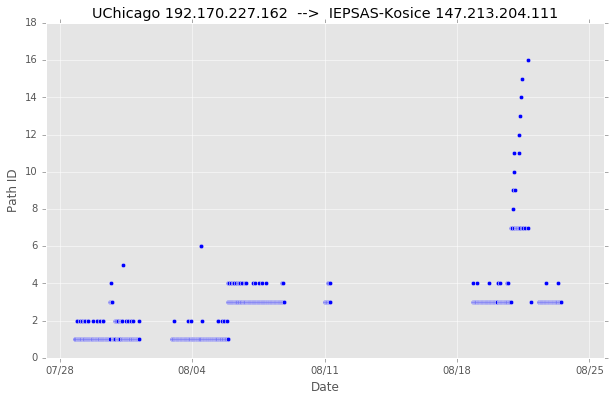



16 192.12.15.111


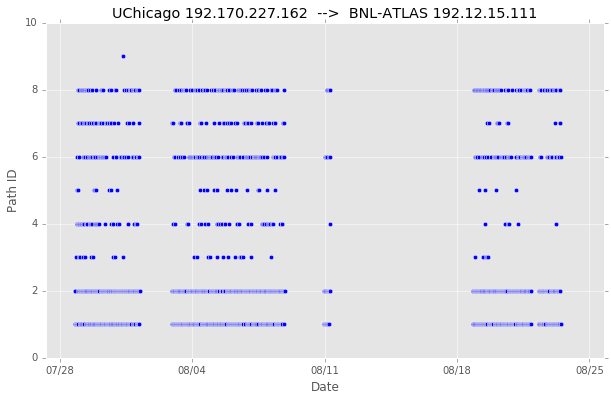



17 149.165.225.2


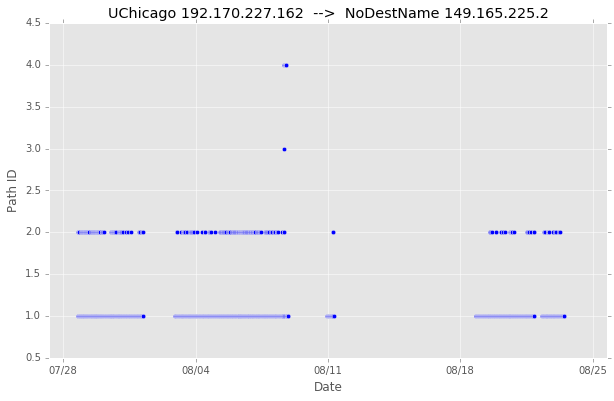



18 147.156.116.41


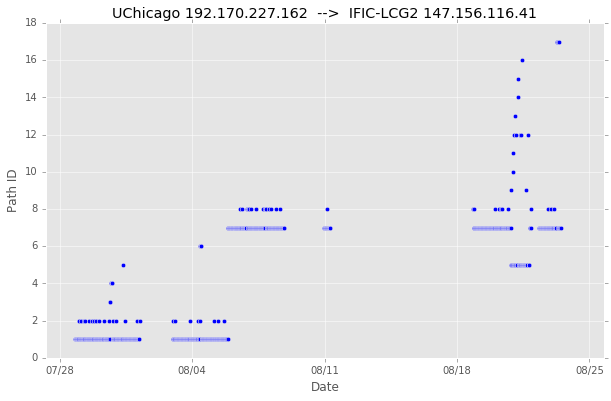



19 148.187.64.26


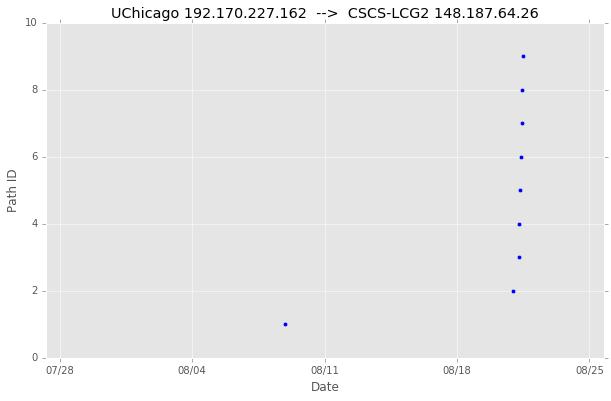



20 194.190.165.191


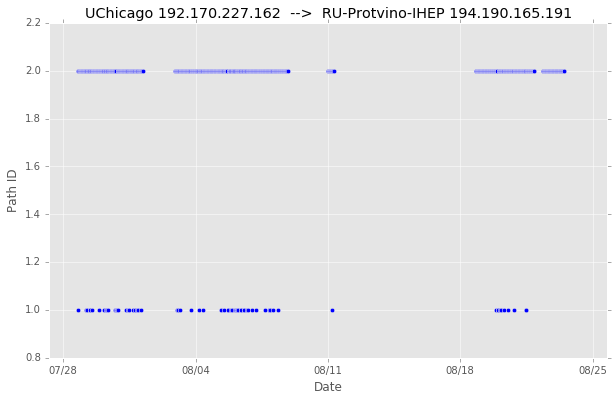



21 129.93.5.165


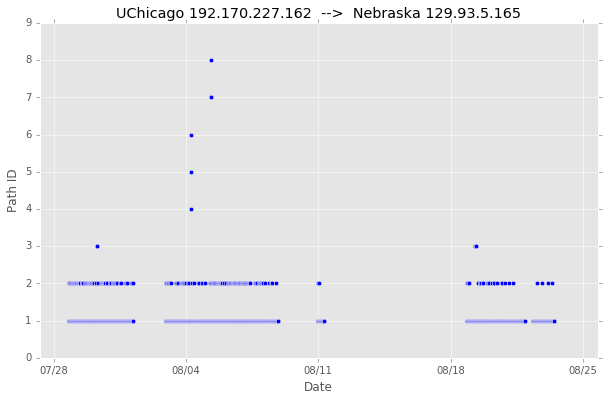



22 192.231.127.40


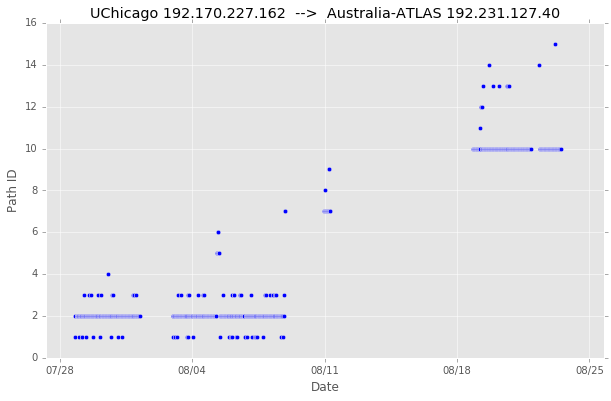



23 146.83.90.6


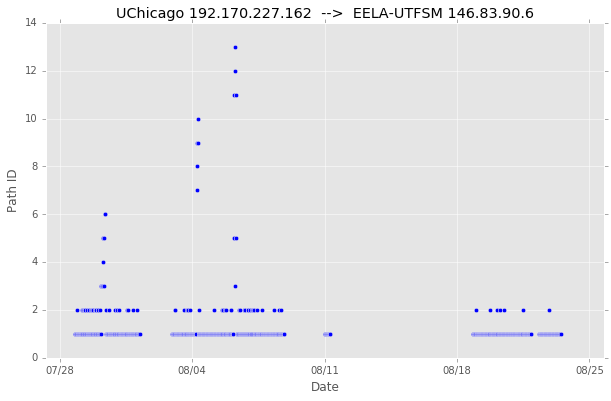



24 157.82.112.69


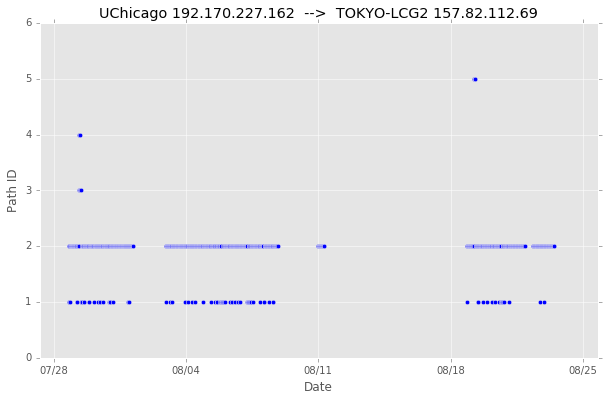



25 194.36.11.37


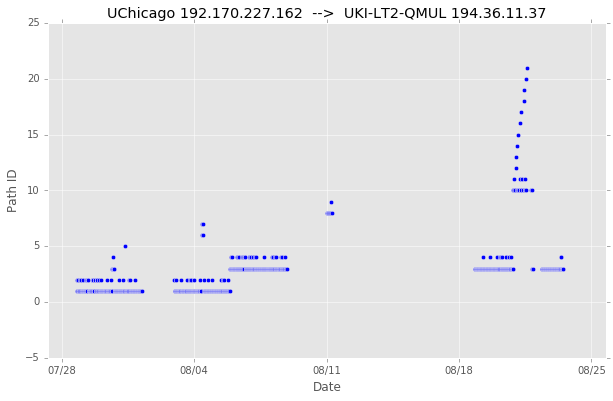



26 130.246.47.130


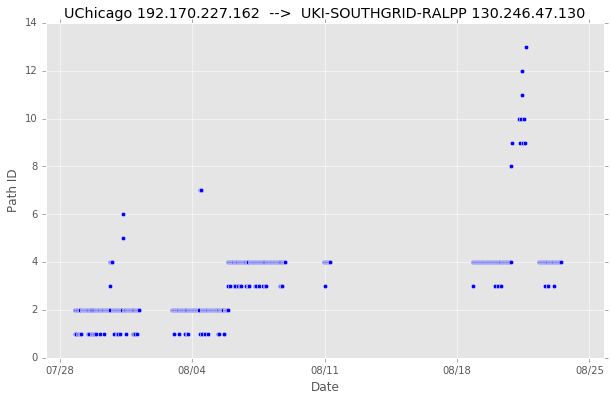



27 109.105.124.88


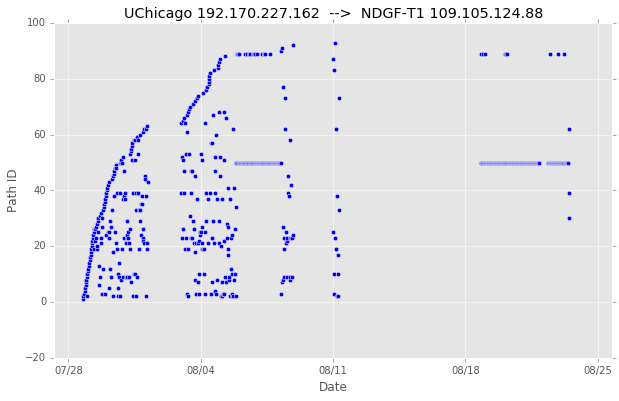



28 192.41.230.62


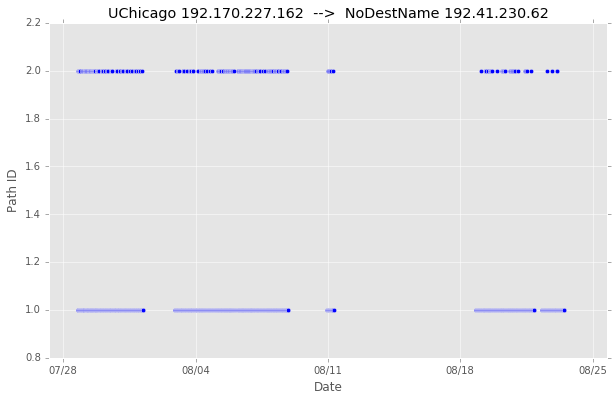



29 192.41.230.60


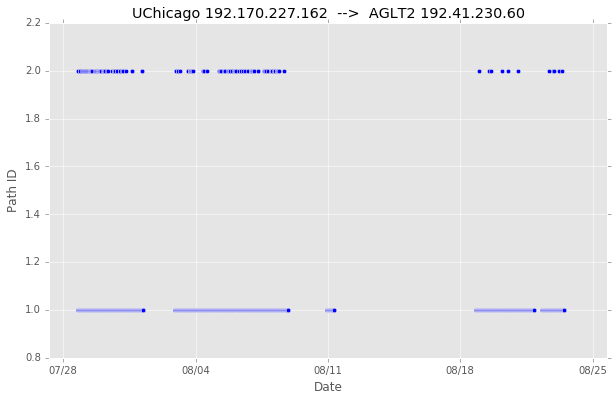



30 128.142.223.246


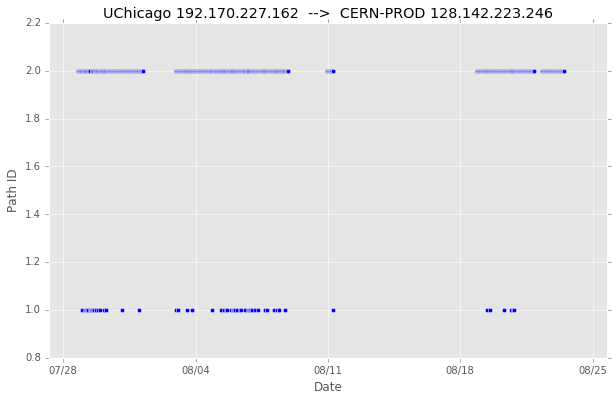



31 149.165.225.4


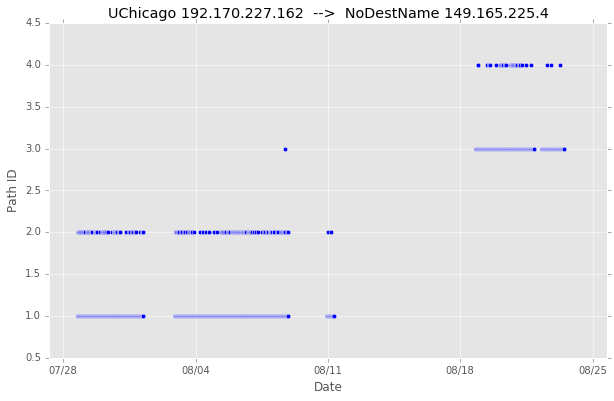



32 192.84.128.111


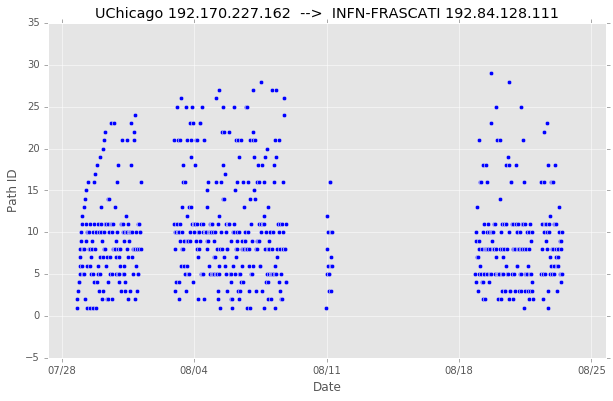



33 144.206.236.188


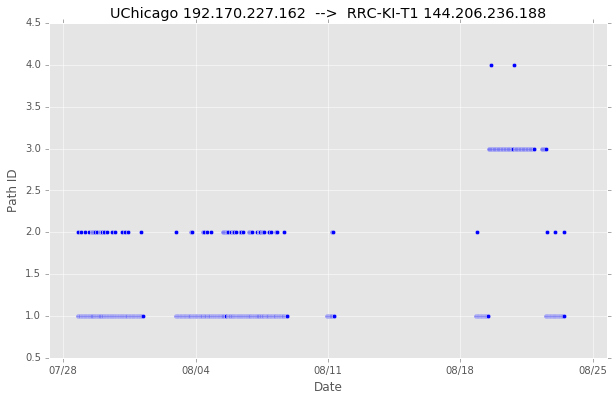



34 147.231.25.191


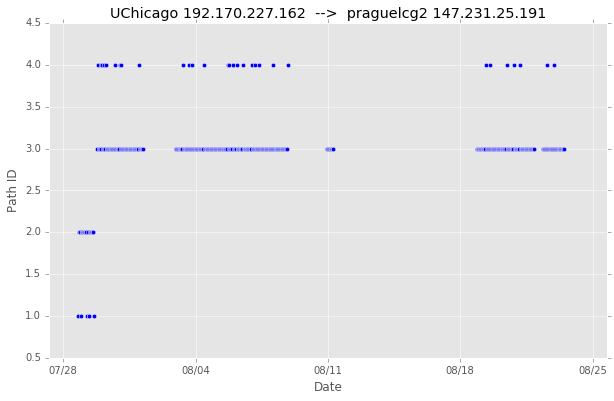



35 193.146.75.139


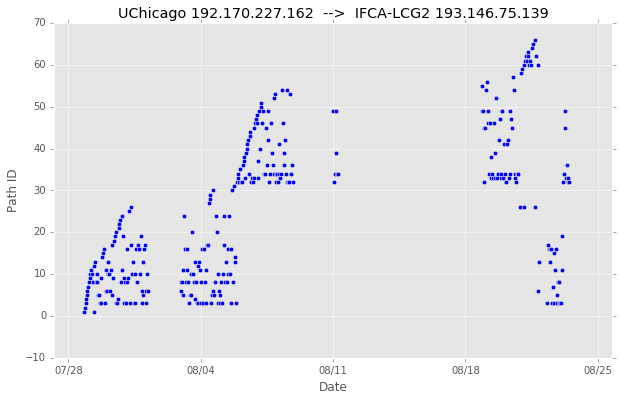



36 206.12.9.1


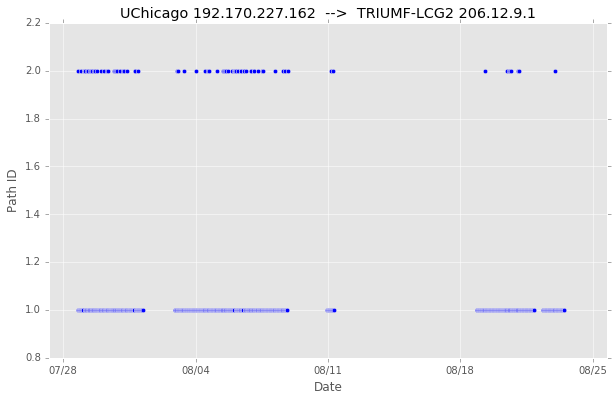



37 206.12.154.59


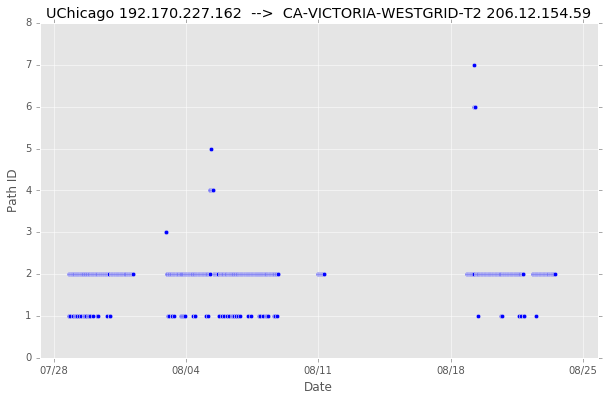



38 192.170.227.164


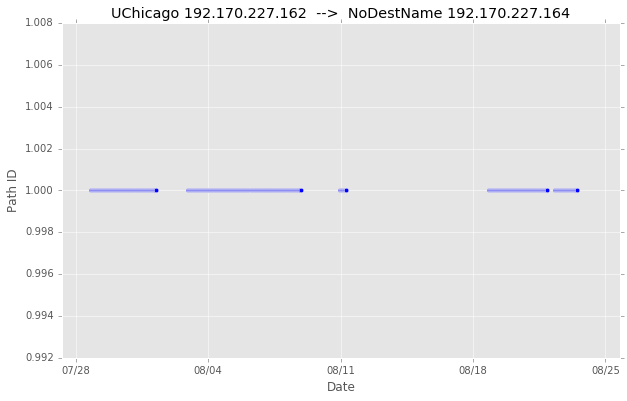



39 193.109.172.187


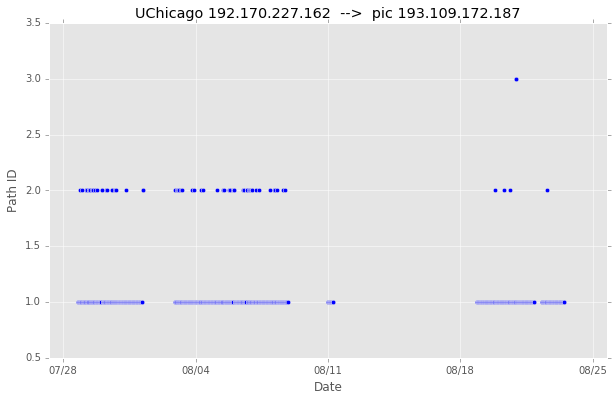



40 138.253.60.81


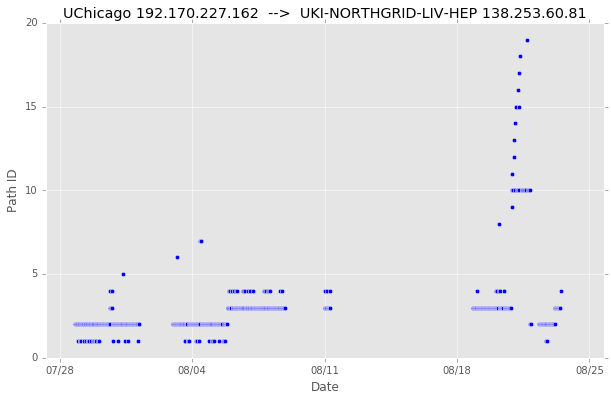



41 130.246.176.110


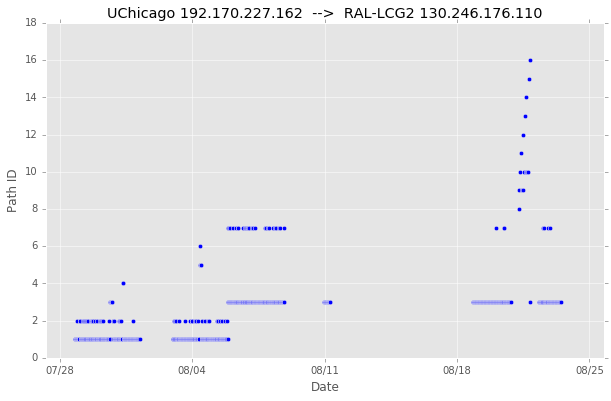



42 72.36.96.9


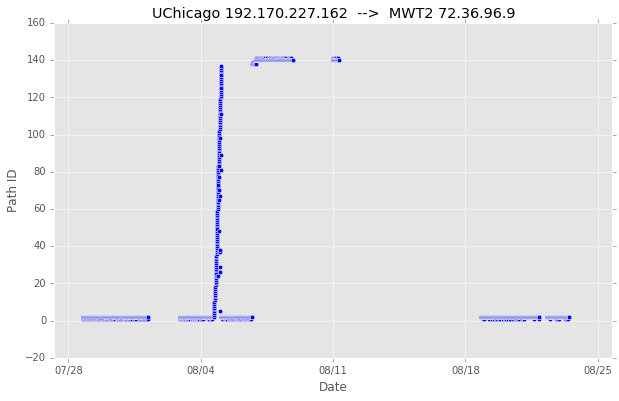



43 142.150.19.60


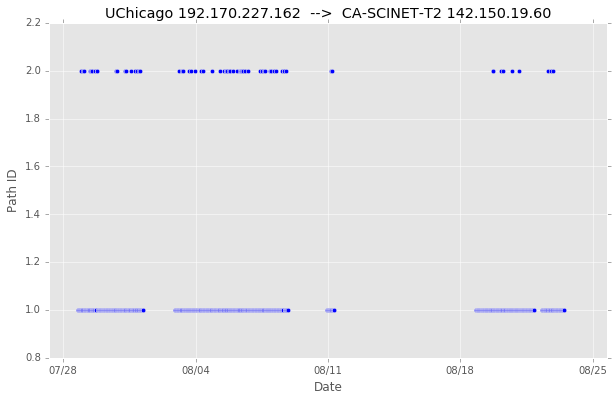



44 134.158.159.86


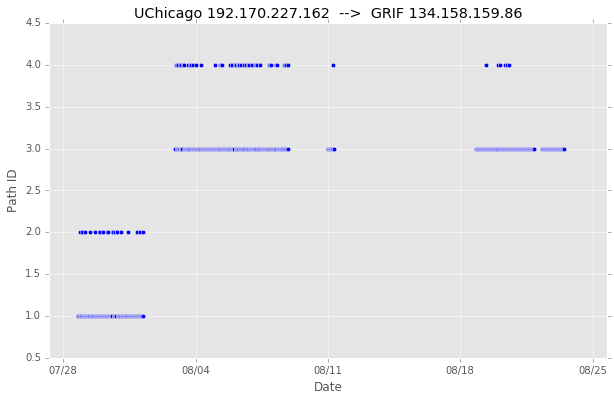



45 193.231.25.238


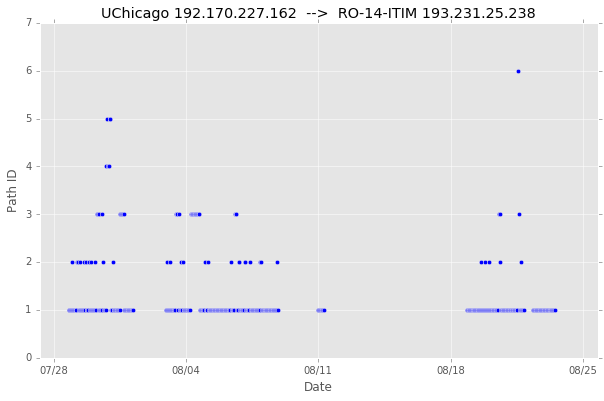



46 145.100.17.9


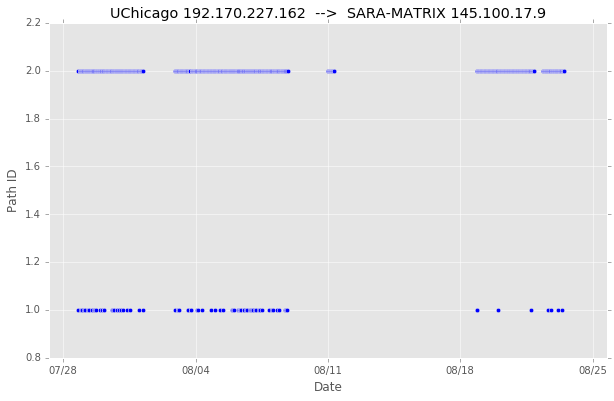



47 164.58.29.118


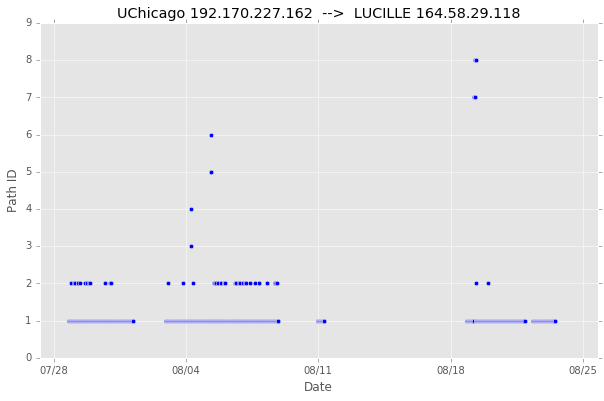



48 134.158.132.201


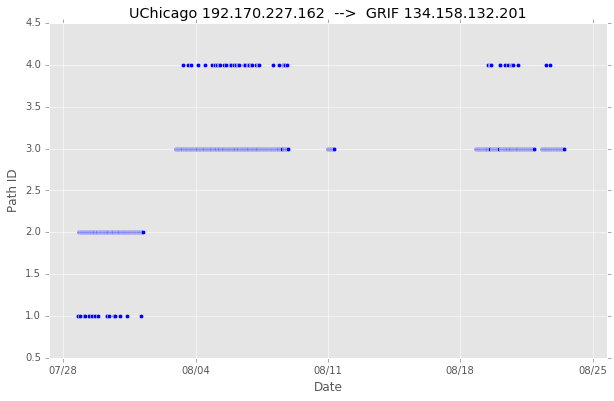



49 85.122.31.73


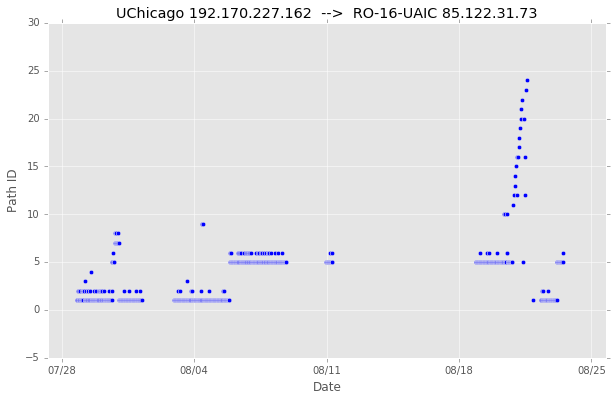



50 192.108.47.6


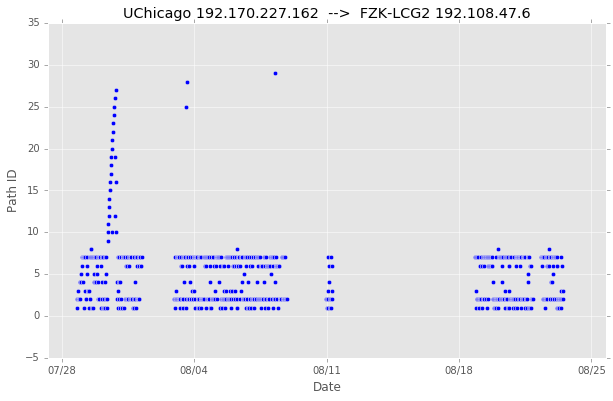



51 194.80.35.168


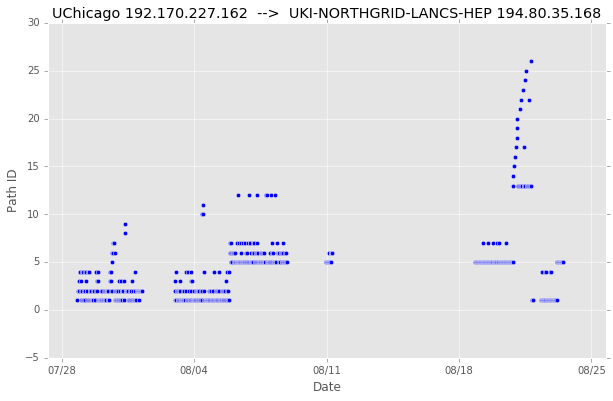



52 129.215.213.69


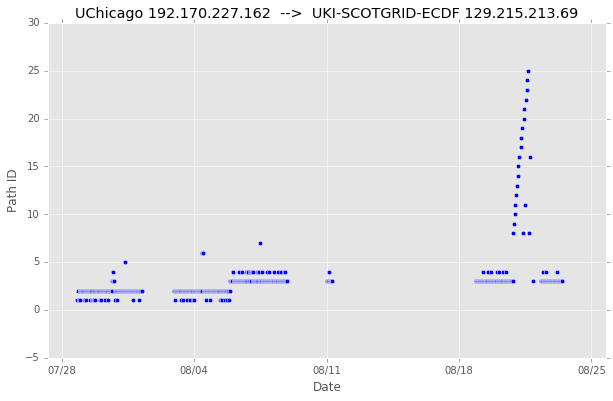



53 134.158.123.184


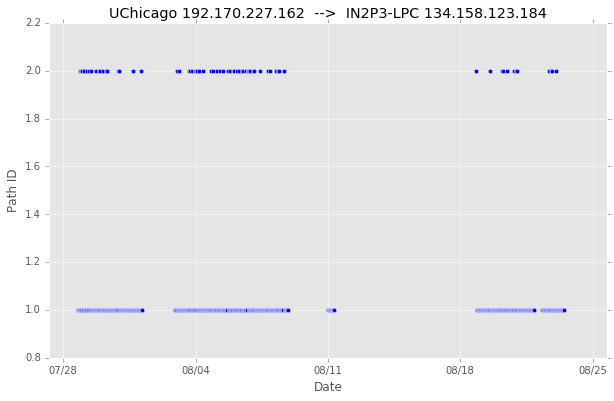



54 131.169.98.29


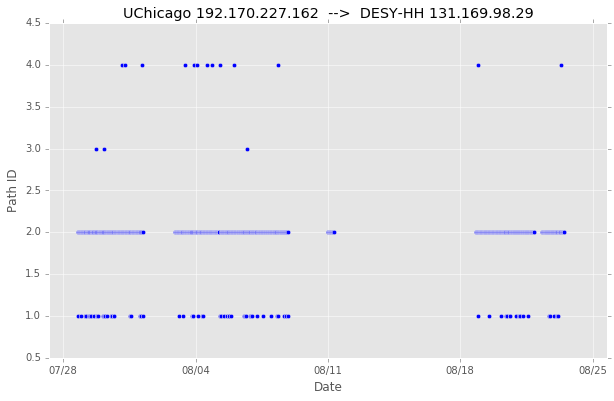



55 149.165.225.224


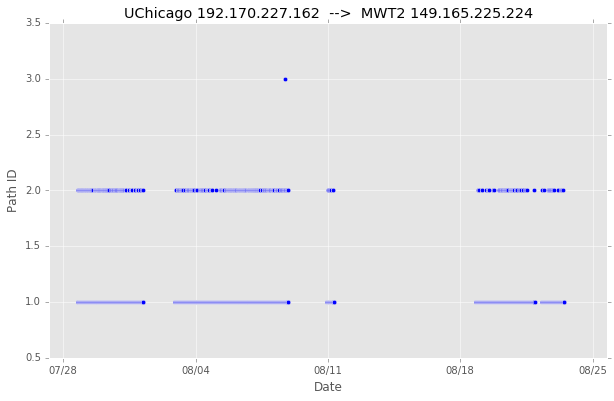



56 141.34.200.29


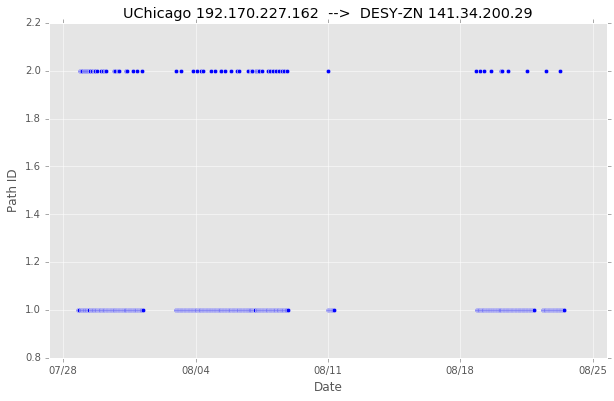



57 134.158.73.244


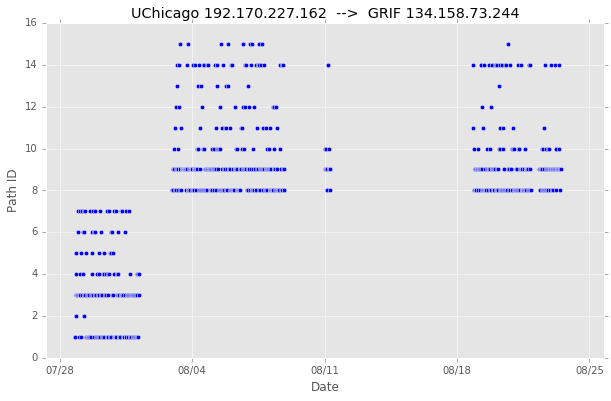



58 206.12.24.250


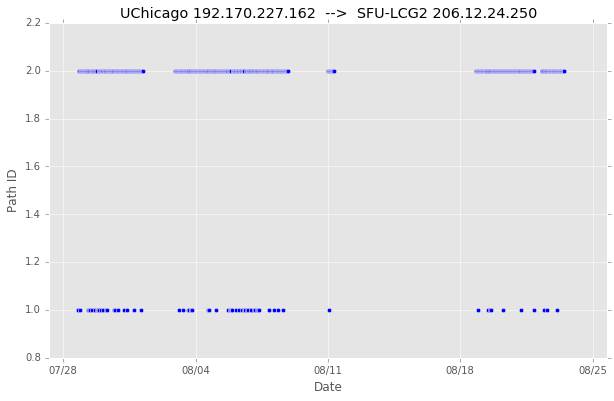



59 159.93.225.210


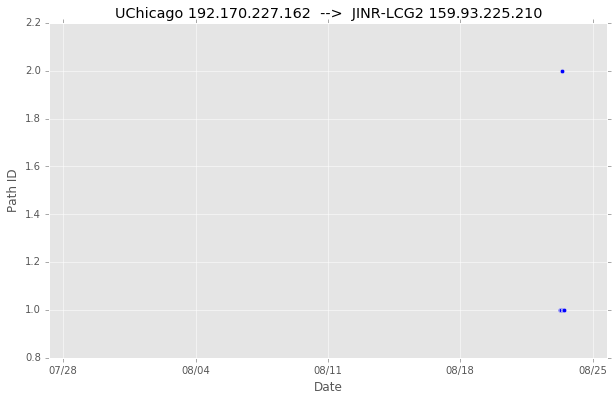



60 144.206.237.141


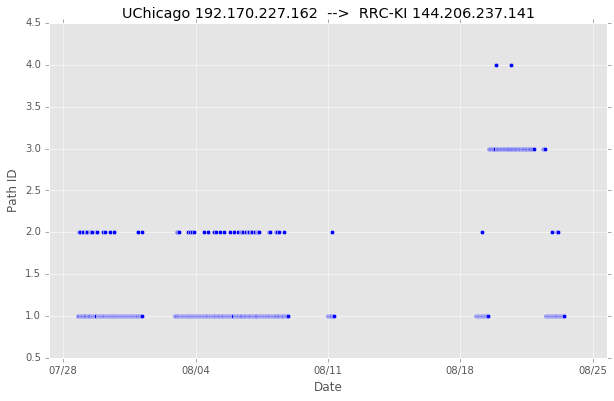



61 141.108.35.17


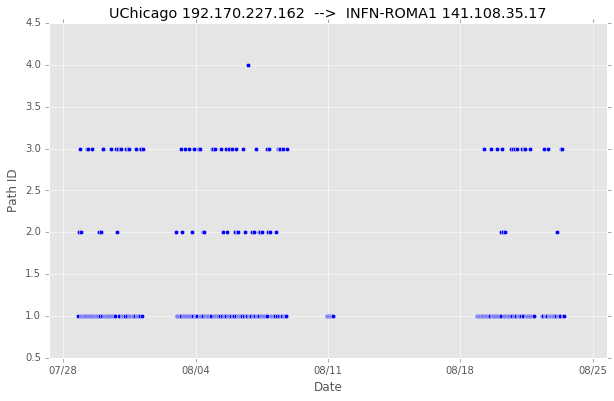



62 134.158.20.191


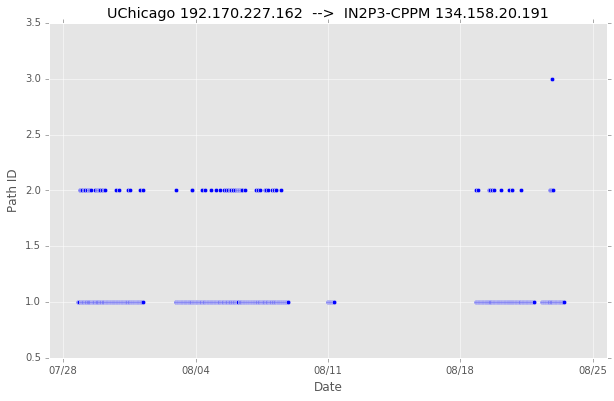



63 134.158.103.9


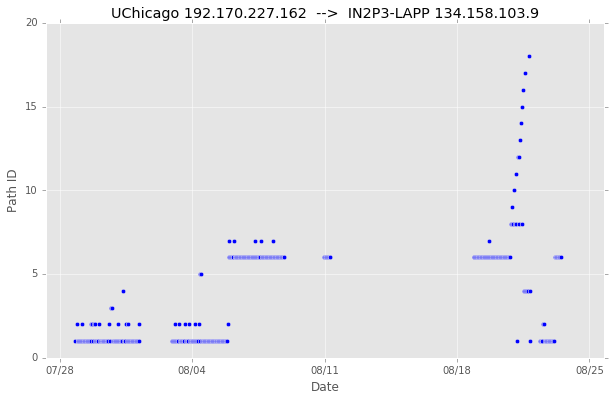



64 192.12.15.23


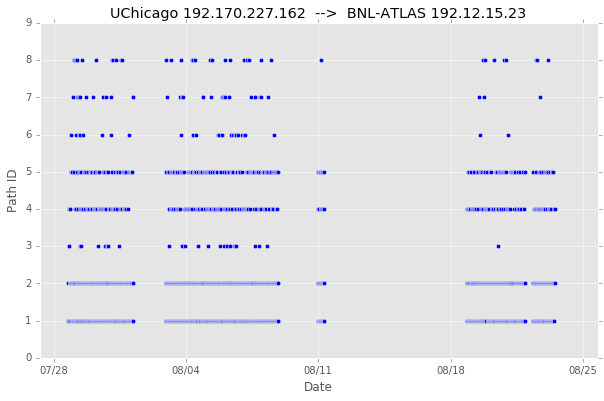



65 192.135.14.39


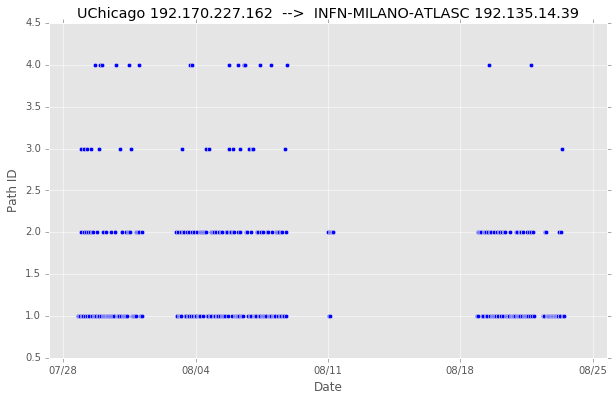



66 141.142.141.2


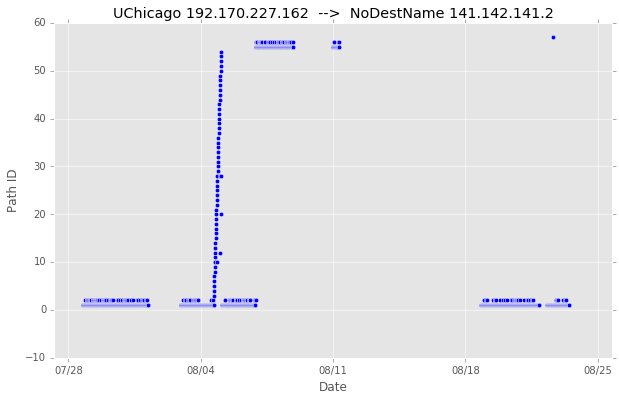



67 132.206.245.253


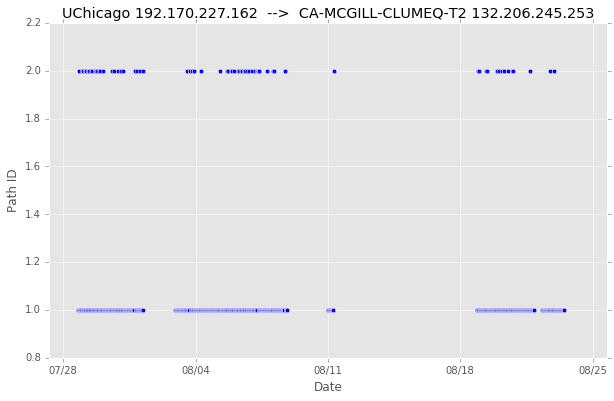



68 149.165.224.248


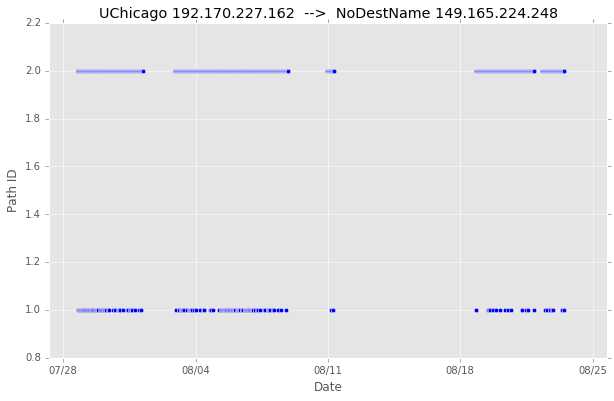



69 195.194.105.177


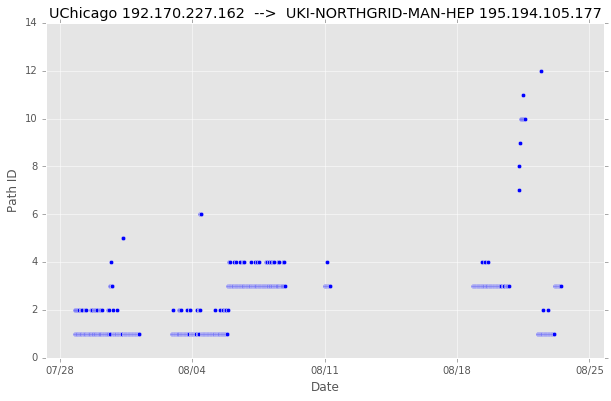



70 192.41.236.36


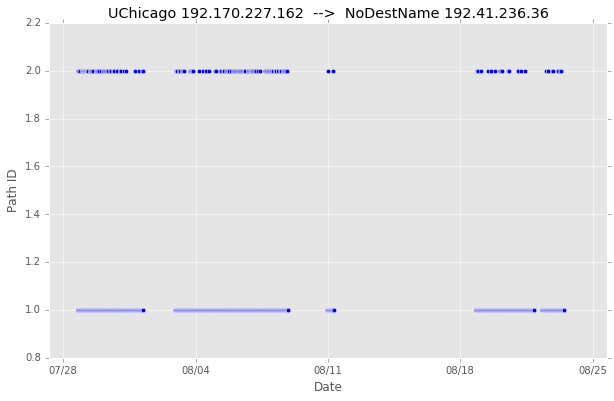



71 163.1.5.211


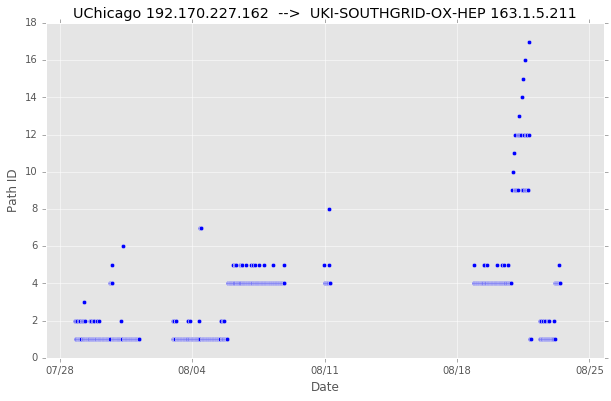



72 90.147.67.253


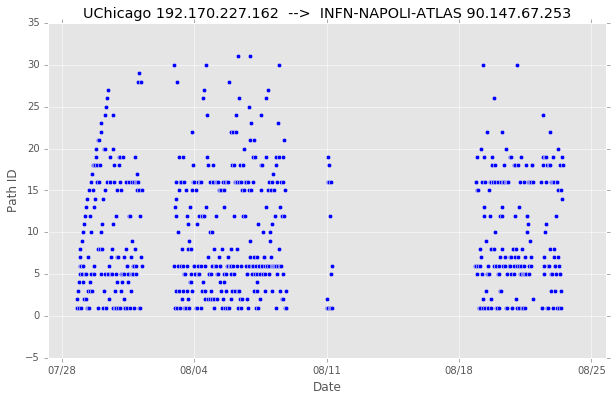



73 72.36.126.132


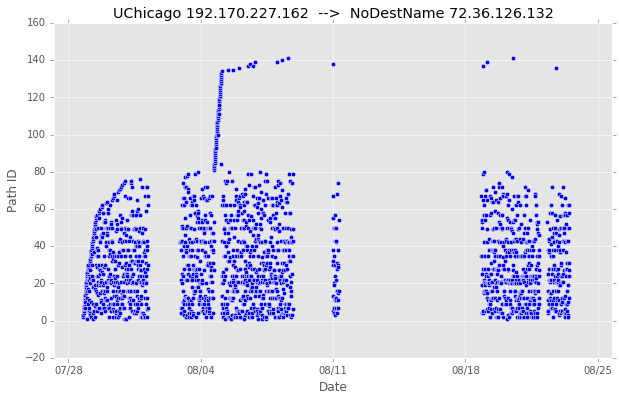



74 81.180.86.41


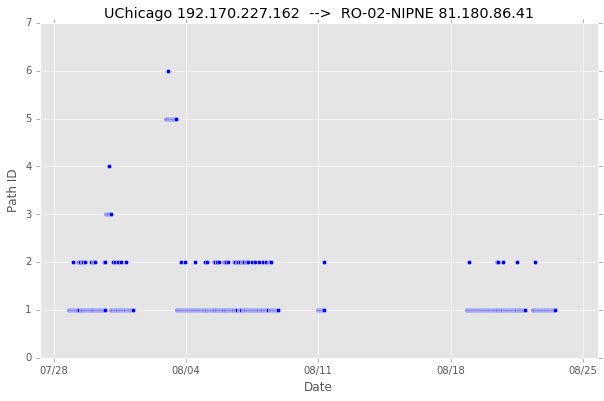



75 194.85.69.74


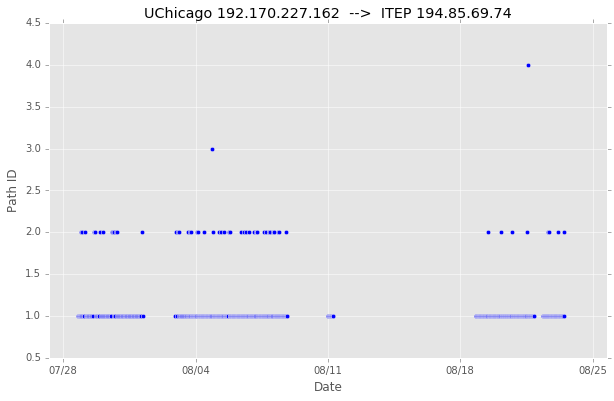



76 193.48.83.97


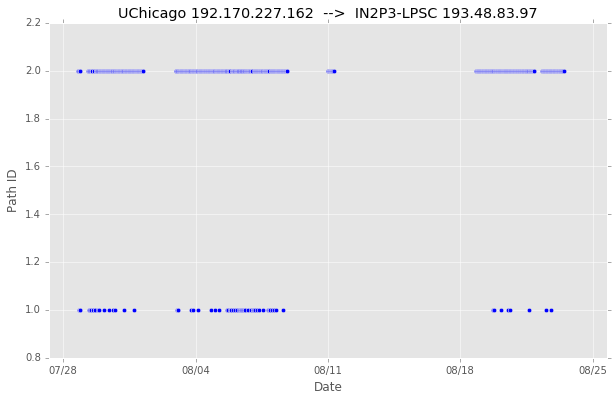



77 193.58.172.57


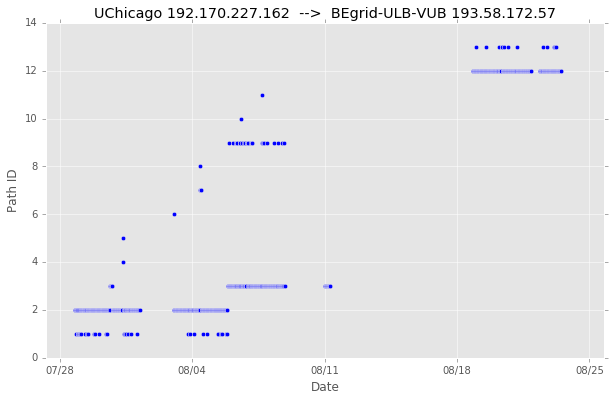



78 129.107.255.27


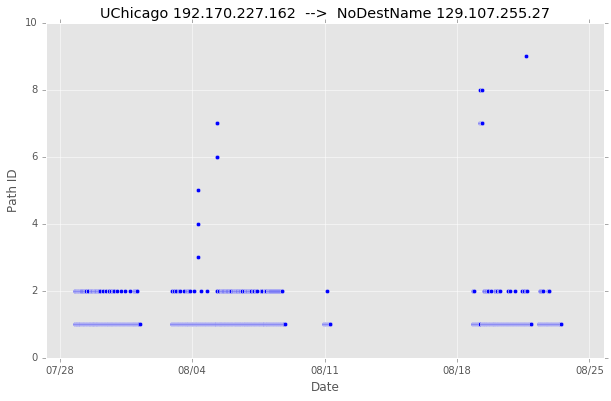



79 192.54.207.251


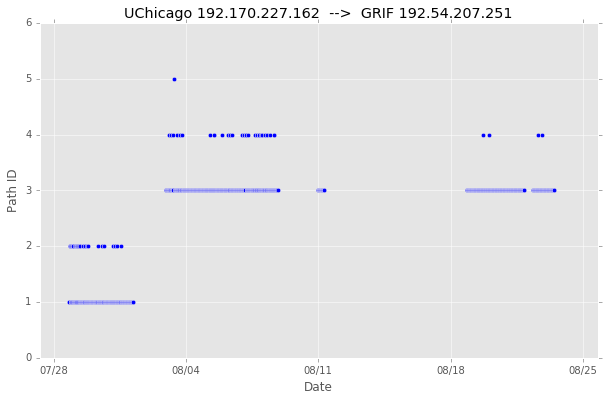



80 159.93.226.101


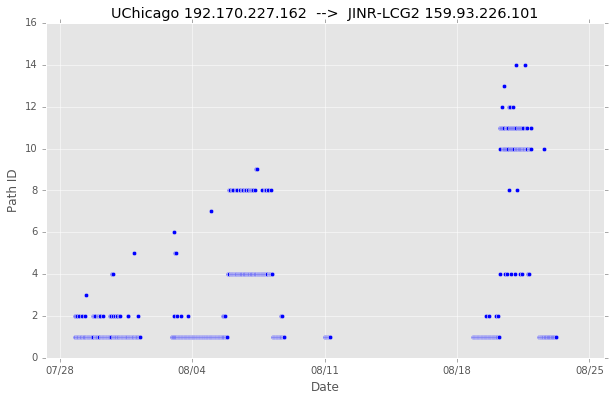



81 150.244.247.3


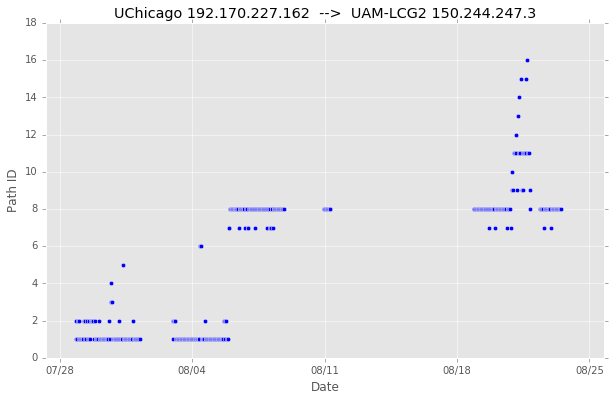

In [111]:
# Draw all the path change time series for all the src / dest pairs starting from UChicago

original = np.linspace(0, 604800000 * 4, 5) + 1469664000000
newname = ['07/28', '08/04', '08/11', '08/18', '08/25']

count = 0
for dest_ip in uchicago_all_links:
    count += 1
    print(count, dest_ip)
    df = uchicago_all_links[dest_ip]
    
    dff = df[df.index > 1000000000000]
    
    plt.figure(figsize=(10, 6))
    plt.scatter(dff.index, dff.path_id)
    plt.xlim([1469600000000, 1472150000000])
    plt.xlabel('Date')
    plt.ylabel('Path ID')
    plt.title('{}  -->  {} {}'.format('UChicago 192.170.227.162', site_ip_name[dest_ip], dest_ip))
    
    plt.xticks(original, newname, rotation=0)
    
    plt.show()
    
    print()
    print()

In [47]:
# Take a closer look at one extreme case
df = raw_data_pool['192.170.227.162']['72.36.96.9']

In [48]:
df

,iso_8601,src_prod,dest_prod,path_hash,path_id
1469727629,1469727629,False,False,3.874323e+18,1.0
1469728206,1469728206,False,False,6.761208e+18,2.0
1469728259,1469728259,False,False,6.761208e+18,2.0
1469731488000,2016-07-28T18:44:48,False,False,6.761208e+18,2.0
1469732115000,2016-07-28T18:55:15,False,False,6.761208e+18,2.0
1469732242000,2016-07-28T18:57:22,False,False,3.874323e+18,1.0
1469732405000,2016-07-28T19:00:05,False,False,6.761208e+18,2.0
1469732437000,2016-07-28T19:00:37,False,False,6.761208e+18,2.0
1469732760000,2016-07-28T19:06:00,False,False,6.761208e+18,2.0
1469733022000,2016-07-28T19:10:22,False,False,6.761208e+18,2.0


xmin 1470304800000
xmax 1470391200000
xmax - xmin 86400000 ms
xmax - xmin 1440.0 min
xmax - xmin 24.0 hour


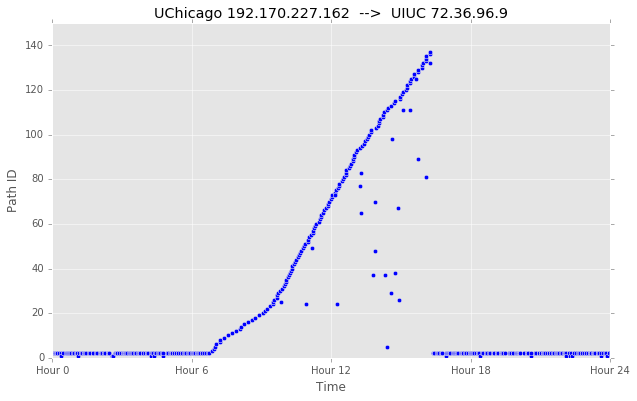

In [69]:
dff = df[df.index > 1000000000000]
    
plt.figure(figsize=(10, 6))
plt.scatter(dff.index, dff.path_id)
plt.ylim([0, 150])
plt.xlabel('Time')
plt.ylabel('Path ID')
plt.title('UChicago 192.170.227.162  -->  UIUC 72.36.96.9')

xmin = 1469600000000 + 604800000 + 100000000   # ms
xmax = 1472150000000 - 604800000 * 2.9         # ms
xmax = xmin + 24 * 60 * 60 * 1000     # ms
print('xmin', xmin)
print('xmax', xmax)
print('xmax - xmin', (xmax-xmin), 'ms')
print('xmax - xmin', (xmax-xmin) / 1000 / 60, 'min')
print('xmax - xmin', (xmax-xmin) / 1000 / 60 / 60, 'hour')
plt.xlim([xmin, xmax])

original = np.linspace(xmin, xmax, 5)
newname = ['Hour 0', 'Hour 6', 'Hour 12', 'Hour 18', 'Hour 24']

plt.xticks(original, newname, rotation=0)

plt.show()

# 08/04/2016 10:00am (UTC)
# 08/05/2016 10:00am (UTC)

In [71]:
# Take an even closer look at the range from Hour 6 to Hour 18, call it df_anomaly

xmin = 1470304800000
xmax = 1470391200000
xdelta = xmax - xmin
xxmin = int(xmin + xdelta / 4)
xxmax = int(xmax - xdelta / 4)
print('xxmin', xxmin)
print('xxmax', xxmax)

xxmin 1470326400000
xxmax 1470369600000


In [74]:
df_anomaly = df[df.index > xxmin]

In [76]:
df_anomaly = df_anomaly[df_anomaly.index < xxmax]

In [77]:
df_anomaly

,iso_8601,src_prod,dest_prod,path_hash,path_id
1470326587000,2016-08-04T16:03:07,False,False,6.761208e+18,2.0
1470326678000,2016-08-04T16:04:38,False,False,6.761208e+18,2.0
1470326878000,2016-08-04T16:07:58,False,False,6.761208e+18,2.0
1470327131000,2016-08-04T16:12:11,False,False,6.761208e+18,2.0
1470327229000,2016-08-04T16:13:49,False,False,6.761208e+18,2.0
1470327335000,2016-08-04T16:15:35,False,False,6.761208e+18,2.0
1470327522000,2016-08-04T16:18:42,False,False,6.761208e+18,2.0
1470327731000,2016-08-04T16:22:11,False,False,6.761208e+18,2.0
1470327969000,2016-08-04T16:26:09,False,False,6.761208e+18,2.0
1470327987000,2016-08-04T16:26:27,False,False,6.761208e+18,2.0


In [ ]:
set_hops = set()

# Print out all the hops details during the problematic time period, and examine by human eyes

for r in range(206):   # Because it has 206 lines of records
    path_hash = int(df_anomaly.path_hash.iloc[r])
    path_hash = adjust_path_hash(path_hash)   # Get back the original precise hash value
    print()
    print(path_hash)
    print(path_hash_hops[path_hash])
    print()
    print('=========================================')
    print()
    for hops in path_hash_hops[path_hash]:
        set_hops.add(hops)
    print()

In [81]:
set_hops   # All the hops ever used during this problematic time period

{'130.126.1.110',
 '192.170.224.77',
 '192.170.224.98',
 '192.170.225.6',
 '192.170.226.1',
 '72.36.126.65',
 '72.36.126.69',
 '72.36.126.73',
 '72.36.126.78',
 '72.36.126.82',
 '72.36.126.85',
 '72.36.126.90',
 '72.36.126.94',
 '72.36.126.98',
 '72.36.127.157',
 '72.36.127.186',
 '72.36.80.13',
 '72.36.96.9'}